In [32]:
from src.data_gen import data_gen, data_gen_xu
from src.gsc_ipca import gsc_ipca
from src.gsc_ife import gsc_ife
from src.gsc_ipca_2 import gsc_ipca_2
from src.scm import scm

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set the global font to be Times New Roman
import matplotlib as mpl
mpl.rcParams['font.family'] = 'Times New Roman'
mpl.rcParams['font.size'] = 8 
color = sns.color_palette()
color

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529)]

### 1. My data generating process

#### 1.1 Observe all the covariates

In [2]:
# number of time periods and individuals
T0, T1 = 20, 10
N_co, N_tr = 45, 5

# number of covariates and time-varying factors
L, K = 10, 2
# drift and ratio of observing covariates
drift, m = 2, 1

In [3]:
bias_dict11 = {'bias_ipca': [], 'bias_ife': [], 'bias_scm': []}

for i in range(1000):
    # Generate data 
    df = data_gen(T0=T0, T1=T1, N_co=N_co, N_tr=N_tr, L=L, K=K, drift=drift)
    df['const'] = 1

    # True ATT calculation
    ATT = df.query("tr_group==1").groupby('time')['eff'].mean()[-T1:].mean()

    # Define covariates and observed covariates
    covariates = ['x' + str(i) for i in range(1, L+1)]
    L_obs = round(m * len(covariates))
    obs_covariates = list(np.random.choice(covariates, size=L_obs, replace=False))+ ['const']

    # Fit the GSC-IPCA model and calculate bias
    gsc_ipca_model2 = gsc_ipca_2(df=df, id='id', time='time', outcome='y', covariates=obs_covariates, treated='treated', K=K)
    gsc_ipca_model2.fit(verbose=True)
    att_ipca = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - gsc_ipca_model2.Y_syn.mean(axis=0)[-T1:]).mean()
    bias_dict11['bias_ipca'].append(att_ipca - ATT)

    # Fit the GSC-IFe model and calculate bias
    gsc_ife_model = gsc_ife(df=df, id='id', time='time', outcome='y', covariates=obs_covariates, treated='treated', K=K)
    gsc_ife_model.fit(verbose=True)
    att_ife = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - gsc_ife_model.Y_syn.mean(axis=0)[-T1:]).mean()
    bias_dict11['bias_ife'].append(att_ife - ATT)

    # Fit the SCM model and calculate bias
    scm_model = scm(df=df, id='id', time='time', outcome='y', treated='treated', v=None)
    scm_model.fit()
    att_scm = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - scm_model.Y_syn[-T1:]).mean()
    bias_dict11['bias_scm'].append(att_scm - ATT)

iter 0: tolGamma = 0.06494656287031038 and tolFac = 53.47430754560695
iter 1: tolGamma = 0.032145412880730445 and tolFac = 35.05502969036792
iter 2: tolGamma = 0.007945017864938595 and tolFac = 15.745796875065519
iter 3: tolGamma = 0.00441609832444969 and tolFac = 6.434093829978776
iter 4: tolGamma = 0.0014620786447035322 and tolFac = 2.9052526123336264
iter 5: tolGamma = 0.0004945874670234003 and tolFac = 1.1318551228788145
iter 6: tolGamma = 0.00017281596322011455 and tolFac = 0.43699028163970155
iter 7: tolGamma = 6.16318681103574e-05 and tolFac = 0.1693365355913592
iter 8: tolGamma = 2.2380218512772776e-05 and tolFac = 0.06582569913743441
iter 9: tolGamma = 8.263335237720937e-06 and tolFac = 0.025631842090763968
iter 10: tolGamma = 3.1331779971749407e-06 and tolFac = 0.009988841323309572
iter 11: tolGamma = 1.2272309468965015e-06 and tolFac = 0.0038941087090371695
iter 12: tolGamma = 4.79919180187971e-07 and tolFac = 0.0015183444282662606
iter 13: tolGamma = 1.8749140314605617e-07 

#### 1.2 Observe 2/3 covariates

In [4]:
# m: ratio of observing covariates
m = 2/3

bias_dict12 = {'bias_ipca': [], 'bias_ife': [], 'bias_scm': []}

for i in range(1000):
    # Generate data 
    df = data_gen(T0=T0, T1=T1, N_co=N_co, N_tr=N_tr, L=L, K=K, drift=drift)
    df['const'] = 1

    # True ATT calculation
    ATT = df.query("tr_group==1").groupby('time')['eff'].mean()[-T1:].mean()

    # Define covariates and observed covariates
    covariates = ['x' + str(i) for i in range(1, L+1)]
    L_obs = round(m * len(covariates))
    obs_covariates = list(np.random.choice(covariates, size=L_obs, replace=False))+ ['const']

    # Fit the GSC-IPCA model and calculate bias
    gsc_ipca_model2 = gsc_ipca_2(df=df, id='id', time='time', outcome='y', covariates=obs_covariates, treated='treated', K=K)
    gsc_ipca_model2.fit(verbose=True)
    att_ipca = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - gsc_ipca_model2.Y_syn.mean(axis=0)[-T1:]).mean()
    bias_dict12['bias_ipca'].append(att_ipca - ATT)

    # Fit the GSC-IFe model and calculate bias
    gsc_ife_model = gsc_ife(df=df, id='id', time='time', outcome='y', covariates=obs_covariates, treated='treated', K=K)
    gsc_ife_model.fit(verbose=True)
    att_ife = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - gsc_ife_model.Y_syn.mean(axis=0)[-T1:]).mean()
    bias_dict12['bias_ife'].append(att_ife - ATT)

    # Fit the SCM model and calculate bias
    scm_model = scm(df=df, id='id', time='time', outcome='y', treated='treated', v=None)
    scm_model.fit()
    att_scm = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - scm_model.Y_syn[-T1:]).mean()
    bias_dict12['bias_scm'].append(att_scm - ATT)

iter 0: tolGamma = 0.08963523169305097 and tolFac = 22.99024234816629
iter 1: tolGamma = 0.005478156305863725 and tolFac = 9.471459350073307
iter 2: tolGamma = 0.003971920240957463 and tolFac = 10.914422143398028
iter 3: tolGamma = 0.0041425394690625394 and tolFac = 9.383988155742125
iter 4: tolGamma = 0.003179927206627988 and tolFac = 3.9682408531257103
iter 5: tolGamma = 0.0026710233840475453 and tolFac = 3.608082130804375
iter 6: tolGamma = 0.0023912234603492774 and tolFac = 2.877734140220607
iter 7: tolGamma = 0.001956516759929701 and tolFac = 2.6311979500686853
iter 8: tolGamma = 0.0014465287163888223 and tolFac = 1.947756662160316
iter 9: tolGamma = 0.0009544724174077469 and tolFac = 1.371367748421076
iter 10: tolGamma = 0.0005724358659185014 and tolFac = 0.9030420805539461
iter 11: tolGamma = 0.00032455409105563125 and tolFac = 0.5574260403265487
iter 12: tolGamma = 0.0001924823142328766 and tolFac = 0.33157093946247346
iter 13: tolGamma = 0.00011277659957845132 and tolFac = 0.1

### 1.3 Observe only 1/3 covariates

In [5]:
# m: ratio of observing covariates
m = 1/3

bias_dict13 = {'bias_ipca': [], 'bias_ife': [], 'bias_scm': []}

for i in range(1000):
    # Generate data 
    df = data_gen(T0=T0, T1=T1, N_co=N_co, N_tr=N_tr, L=L, K=K, drift=drift)
    df['const'] = 1

    # True ATT calculation
    ATT = df.query("tr_group==1").groupby('time')['eff'].mean()[-T1:].mean()

    # Define covariates and observed covariates
    covariates = ['x' + str(i) for i in range(1, L+1)]
    L_obs = round(m * len(covariates))
    obs_covariates = list(np.random.choice(covariates, size=L_obs, replace=False))+ ['const']

    # Fit the GSC-IPCA model and calculate bias
    gsc_ipca_model2 = gsc_ipca_2(df=df, id='id', time='time', outcome='y', covariates=obs_covariates, treated='treated', K=K)
    gsc_ipca_model2.fit(verbose=True)
    att_ipca = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - gsc_ipca_model2.Y_syn.mean(axis=0)[-T1:]).mean()
    bias_dict13['bias_ipca'].append(att_ipca - ATT)

    # Fit the GSC-IFe model and calculate bias
    gsc_ife_model = gsc_ife(df=df, id='id', time='time', outcome='y', covariates=obs_covariates, treated='treated', K=K)
    gsc_ife_model.fit(verbose=True)
    att_ife = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - gsc_ife_model.Y_syn.mean(axis=0)[-T1:]).mean()
    bias_dict13['bias_ife'].append(att_ife - ATT)

    # Fit the SCM model and calculate bias
    scm_model = scm(df=df, id='id', time='time', outcome='y', treated='treated', v=None)
    scm_model.fit()
    att_scm = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - scm_model.Y_syn[-T1:]).mean()
    bias_dict13['bias_scm'].append(att_scm - ATT)

iter 0: tolGamma = 0.06152784763283956 and tolFac = 66.71984349739594
iter 1: tolGamma = 0.0073550963997001395 and tolFac = 25.8838157785606
iter 2: tolGamma = 0.0020595828526745793 and tolFac = 31.636869187842343
iter 3: tolGamma = 0.001623659387831114 and tolFac = 15.058721952542037
iter 4: tolGamma = 0.001397815648655848 and tolFac = 10.211155484854316
iter 5: tolGamma = 0.0008306427566510469 and tolFac = 5.6951250860153095
iter 6: tolGamma = 0.00043570165055330234 and tolFac = 2.9314181124428895
iter 7: tolGamma = 0.0002210059122434993 and tolFac = 1.477800758576942
iter 8: tolGamma = 0.00011123427225438048 and tolFac = 0.7424464766691141
iter 9: tolGamma = 5.591176819588067e-05 and tolFac = 0.37309698050268914
iter 10: tolGamma = 2.8109148805688378e-05 and tolFac = 0.1876126194710963
iter 11: tolGamma = 1.4137380067280603e-05 and tolFac = 0.09438595261474347
iter 12: tolGamma = 7.112712427925771e-06 and tolFac = 0.04749777409550404
iter 13: tolGamma = 3.579307666222442e-06 and tol

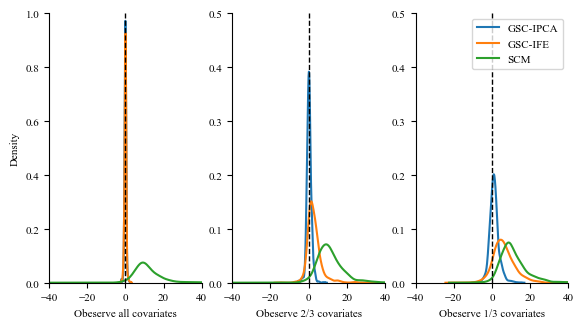

In [36]:
# Convert the dictionary to a pandas DataFrame for analysis or visualization
bias_df11 = pd.DataFrame(bias_dict11)
bias_df12 = pd.DataFrame(bias_dict12)
bias_df13 = pd.DataFrame(bias_dict13)

# plot
fig, ax = plt.subplots(1, 3, figsize=(6.7, 3.5))

sns.kdeplot(bias_df11['bias_ipca'], label='GSC-IPCA', ax=ax[0])
sns.kdeplot(bias_df11['bias_ife'], label='GSC-IFE', ax=ax[0])
sns.kdeplot(bias_df11['bias_scm'], label='SCM', ax=ax[0])

sns.kdeplot(bias_df12['bias_ipca'], label='GSC-IPCA', ax=ax[1])
sns.kdeplot(bias_df12['bias_ife'], label='GSC-IFE', ax=ax[1])
sns.kdeplot(bias_df12['bias_scm'], label='SCM', ax=ax[1])

sns.kdeplot(bias_df13['bias_ipca'], label='GSC-IPCA', ax=ax[2])
sns.kdeplot(bias_df13['bias_ife'], label='GSC-IFE', ax=ax[2])
sns.kdeplot(bias_df13['bias_scm'], label='SCM', ax=ax[2])

for i in range(3):
    ax[i].axvline(0, color='black', linestyle='--', linewidth=1)
ax[0].set(xlabel='Obeserve all covariates', ylabel='Density', ylim=(0, 1), xlim=(-40, 40))
ax[1].set(xlabel='Obeserve 2/3 covariates', ylabel='', ylim=(0, 0.5), xlim=(-40, 40))
ax[2].set(xlabel='Obeserve 1/3 covariates', ylabel='', ylim=(0, 0.5), xlim=(-40, 40))
    
plt.legend()
sns.despine()
#plt.savefig('figs/bias_compar1.png', dpi=300)

### 2. Yiqing Xun data generating process

#### 2.1 Observe all the covariates

In [37]:
# number of time periods and individuals
T0, T1 = 20, 10
N_co, N_tr = 45, 5

# number of covariates and time-varying factors
L, K = 10, 2
# similarity and ratio of observing covariates
w, m = 0.8, 1

In [38]:
bias_dict21 = {'bias_ipca': [], 'bias_ife': [], 'bias_scm': []}

for i in range(1000):
    # Generate data 
    df = data_gen_xu(T0=T0, T1=T1, N_co=N_co, N_tr=N_tr, L=L, K=K, w=w)
    df['const'] = 1

    # True ATT calculation
    ATT = df.query("tr_group==1").groupby('time')['eff'].mean()[-T1:].mean()

    # Define covariates and observed covariates
    covariates = ['x' + str(i) for i in range(1, L+1)]
    L_obs = round(m * len(covariates))
    obs_covariates = list(np.random.choice(covariates, size=L_obs, replace=False))+ ['const']

    # Fit the GSC-IPCA model and calculate bias
    gsc_ipca_model2 = gsc_ipca_2(df=df, id='id', time='time', outcome='y', covariates=obs_covariates, treated='treated', K=K)
    gsc_ipca_model2.fit(verbose=True)
    att_ipca = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - gsc_ipca_model2.Y_syn.mean(axis=0)[-T1:]).mean()
    bias_dict21['bias_ipca'].append(att_ipca - ATT)

    # Fit the GSC-IFe model and calculate bias
    gsc_ife_model = gsc_ife(df=df, id='id', time='time', outcome='y', covariates=obs_covariates, treated='treated', K=K)
    gsc_ife_model.fit(verbose=True)
    att_ife = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - gsc_ife_model.Y_syn.mean(axis=0)[-T1:]).mean()
    bias_dict21['bias_ife'].append(att_ife - ATT)

    # Fit the SCM model and calculate bias
    scm_model = scm(df=df, id='id', time='time', outcome='y', treated='treated', v=None)
    scm_model.fit()
    att_scm = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - scm_model.Y_syn[-T1:]).mean()
    bias_dict21['bias_scm'].append(att_scm - ATT)

iter 0: tolGamma = 0.06594028732442314 and tolFac = 241.39473416423624
iter 1: tolGamma = 0.052024646102727085 and tolFac = 253.81274073211162
iter 2: tolGamma = 0.011250401728739203 and tolFac = 68.92489371093976
iter 3: tolGamma = 0.0009374144242122282 and tolFac = 10.366792512232852
iter 4: tolGamma = 0.00020186516240172718 and tolFac = 2.1392253819611824
iter 5: tolGamma = 4.977646769156925e-05 and tolFac = 0.47300565524518134
iter 6: tolGamma = 1.2056262187189041e-05 and tolFac = 0.10973261311332294
iter 7: tolGamma = 2.9012391349246764e-06 and tolFac = 0.02598268119630376
iter 8: tolGamma = 6.96381002591789e-07 and tolFac = 0.006203881758864327
iter 9: tolGamma = 1.6703078552964337e-07 and tolFac = 0.0014862738114800322
iter 10: tolGamma = 4.0062669668153826e-08 and tolFac = 0.00035653329767626474
iter 11: tolGamma = 9.610883349364316e-09 and tolFac = 8.556792267455648e-05
iter 12: tolGamma = 2.3060608196233054e-09 and tolFac = 2.053967221371522e-05
iter 13: tolGamma = 5.53407860

#### 2.2 Observe 2/3 covariates

In [39]:
# m: ratio of observing covariates
m = 2/3

bias_dict22 = {'bias_ipca': [], 'bias_ife': [], 'bias_scm': []}

for i in range(1000):
    # Generate data 
    df = data_gen_xu(T0=T0, T1=T1, N_co=N_co, N_tr=N_tr, L=L, K=K, w=w)
    df['const'] = 1

    # True ATT calculation
    ATT = df.query("tr_group==1").groupby('time')['eff'].mean()[-T1:].mean()

    # Define covariates and observed covariates
    covariates = ['x' + str(i) for i in range(1, L+1)]
    L_obs = round(m * len(covariates))
    obs_covariates = list(np.random.choice(covariates, size=L_obs, replace=False))+ ['const']

    # Fit the GSC-IPCA model and calculate bias
    gsc_ipca_model2 = gsc_ipca_2(df=df, id='id', time='time', outcome='y', covariates=obs_covariates, treated='treated', K=K)
    gsc_ipca_model2.fit(verbose=True)
    att_ipca = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - gsc_ipca_model2.Y_syn.mean(axis=0)[-T1:]).mean()
    bias_dict22['bias_ipca'].append(att_ipca - ATT)

    # Fit the GSC-IFe model and calculate bias
    gsc_ife_model = gsc_ife(df=df, id='id', time='time', outcome='y', covariates=obs_covariates, treated='treated', K=K)
    gsc_ife_model.fit(verbose=True)
    att_ife = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - gsc_ife_model.Y_syn.mean(axis=0)[-T1:]).mean()
    bias_dict22['bias_ife'].append(att_ife - ATT)

    # Fit the SCM model and calculate bias
    scm_model = scm(df=df, id='id', time='time', outcome='y', treated='treated', v=None)
    scm_model.fit()
    att_scm = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - scm_model.Y_syn[-T1:]).mean()
    bias_dict22['bias_scm'].append(att_scm - ATT)

iter 0: tolGamma = 0.012308152470694108 and tolFac = 215.40977108191646
iter 1: tolGamma = 0.0037036408251833984 and tolFac = 57.90186730228578
iter 2: tolGamma = 0.000754152270001196 and tolFac = 8.416550259969199
iter 3: tolGamma = 0.00017547413581705672 and tolFac = 2.196593331346449
iter 4: tolGamma = 4.5535952896067476e-05 and tolFac = 0.6029967954098367
iter 5: tolGamma = 1.1831960448233764e-05 and tolFac = 0.1651522588179546
iter 6: tolGamma = 3.0973724716898583e-06 and tolFac = 0.044917308878453355
iter 7: tolGamma = 8.164796536828207e-07 and tolFac = 0.012149151285100857
iter 8: tolGamma = 2.163577636310433e-07 and tolFac = 0.003274048097097193
iter 9: tolGamma = 5.754230089031337e-08 and tolFac = 0.0008802686358109213
iter 10: tolGamma = 1.5341486309626562e-08 and tolFac = 0.00023632731722500466
iter 11: tolGamma = 4.096815657225229e-09 and tolFac = 6.338945716777289e-05
iter 12: tolGamma = 1.0951580100681396e-09 and tolFac = 1.6993034975598675e-05
iter 13: tolGamma = 2.92952

### 2.3 Observe only 1/3 covariates

In [40]:
# m: ratio of observing covariates
m = 1/3

bias_dict23 = {'bias_ipca': [], 'bias_ife': [], 'bias_scm': []}

for i in range(1000):
    # Generate data 
    df = data_gen_xu(T0=T0, T1=T1, N_co=N_co, N_tr=N_tr, L=L, K=K, w=w)
    df['const'] = 1

    # True ATT calculation
    ATT = df.query("tr_group==1").groupby('time')['eff'].mean()[-T1:].mean()

    # Define covariates and observed covariates
    covariates = ['x' + str(i) for i in range(1, L+1)]
    L_obs = round(m * len(covariates))
    obs_covariates = list(np.random.choice(covariates, size=L_obs, replace=False))+ ['const']

    # Fit the GSC-IPCA model and calculate bias
    gsc_ipca_model2 = gsc_ipca_2(df=df, id='id', time='time', outcome='y', covariates=obs_covariates, treated='treated', K=K)
    gsc_ipca_model2.fit(verbose=True)
    att_ipca = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - gsc_ipca_model2.Y_syn.mean(axis=0)[-T1:]).mean()
    bias_dict23['bias_ipca'].append(att_ipca - ATT)

    # Fit the GSC-IFe model and calculate bias
    gsc_ife_model = gsc_ife(df=df, id='id', time='time', outcome='y', covariates=obs_covariates, treated='treated', K=K)
    gsc_ife_model.fit(verbose=True)
    att_ife = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - gsc_ife_model.Y_syn.mean(axis=0)[-T1:]).mean()
    bias_dict23['bias_ife'].append(att_ife - ATT)


    # Fit the SCM model and calculate bias
    scm_model = scm(df=df, id='id', time='time', outcome='y', treated='treated', v=None)
    scm_model.fit()
    att_scm = (df.query("tr_group==1").groupby('time')['y'].mean()[-T1:] - scm_model.Y_syn[-T1:]).mean()
    bias_dict23['bias_scm'].append(att_scm - ATT)

iter 0: tolGamma = 0.028177737246629964 and tolFac = 398.4530208582621
iter 1: tolGamma = 0.016127057105053057 and tolFac = 205.3590222654508
iter 2: tolGamma = 0.0031276505830753337 and tolFac = 94.3401065570304
iter 3: tolGamma = 0.0017724692722361265 and tolFac = 35.72146393719186
iter 4: tolGamma = 0.0006859122672404766 and tolFac = 11.398737410176864
iter 5: tolGamma = 0.00024782174629476607 and tolFac = 3.905559978075786
iter 6: tolGamma = 8.888626905845416e-05 and tolFac = 1.4123198463506696
iter 7: tolGamma = 3.186801779458959e-05 and tolFac = 0.5126588090736277
iter 8: tolGamma = 1.1432766769552821e-05 and tolFac = 0.1861226621720391
iter 9: tolGamma = 4.104655610620914e-06 and tolFac = 0.06774936186799607
iter 10: tolGamma = 1.474716996054115e-06 and tolFac = 0.024613433869248524
iter 11: tolGamma = 5.30164265226743e-07 and tolFac = 0.008928989369309193
iter 12: tolGamma = 1.906974926198235e-07 and tolFac = 0.003235924057776174
iter 13: tolGamma = 6.862441104087125e-08 and to

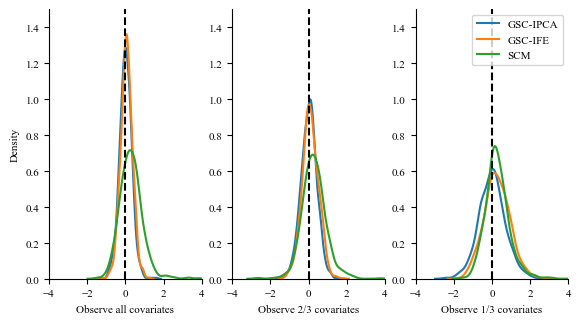

In [43]:
# Convert the dictionary to a pandas DataFrame for analysis or visualization
bias_df21 = pd.DataFrame(bias_dict21)
bias_df22 = pd.DataFrame(bias_dict22)
bias_df23 = pd.DataFrame(bias_dict23)

# plot
fig, ax = plt.subplots(1, 3, figsize=(6.7, 3.5))

sns.kdeplot(bias_df21['bias_ipca'], label='GSC-IPCA', ax=ax[0])
sns.kdeplot(bias_df21['bias_ife'], label='GSC-IFE', ax=ax[0])
sns.kdeplot(bias_df21['bias_scm'], label='SCM', ax=ax[0])

sns.kdeplot(bias_df22['bias_ipca'], label='GSC-IPCA', ax=ax[1])
sns.kdeplot(bias_df22['bias_ife'], label='GSC-IFE', ax=ax[1])
sns.kdeplot(bias_df22['bias_scm'], label='SCM', ax=ax[1])

sns.kdeplot(bias_df23['bias_ipca'], label='GSC-IPCA', ax=ax[2])
sns.kdeplot(bias_df23['bias_ife'], label='GSC-IFE', ax=ax[2])
sns.kdeplot(bias_df23['bias_scm'], label='SCM', ax=ax[2])

for i in range(3):
    ax[i].set(xlim=(-4, 4), ylim=(0, 1.5))
    ax[i].axvline(0, color='black', linestyle='--')
ax[0].set(ylabel='Density', xlabel='Observe all covariates')
ax[1].set(ylabel='', xlabel='Observe 2/3 covariates')
ax[2].set(ylabel='', xlabel='Observe 1/3 covariates')

plt.legend()
sns.despine()
plt.savefig('figs/bias_compar2.png', dpi=300)